# Animating a tracking experiment

This notebook creates a movie based on the input- and output data of WAM2layers.
I tried to use xmovie to directly create a plot based on an xarray dataset, but
in the end I started doing more and more custom things.

Would be nice if we could standardize this further such that we can at some
point make it part of the standardized visualization scripts.

In [3]:
import xarray as xr
import numpy as np
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
from cartopy import crs, feature as cf
from pathlib import Path
import pandas as pd

In [153]:
def custom_lighten(cmap):
    """Return new colormap with gradually inceasing alpha.
    https://stackoverflow.com/a/37334212
    """
    new_cmap = cmap(np.arange(cmap.N))
    new_cmap[:,-1] = np.linspace(0, 1, cmap.N)
    return ListedColormap(new_cmap)

def custom_lighten_uniform(cmap):
    """Return new colormap with perceptually uniformly increasing alpha.
    https://stackoverflow.com/a/68809469
    """
    rgb = cmap(np.arange(cmap.N))[:, :3]  # N-by-3
    rgb[np.sum(rgb, axis=1) == 3] = [.99, .99, .99]  # avoid div0
    alpha = 1. - np.min(rgb, axis=1)
    alpha = np.expand_dims(alpha, -1)
    rgb = (rgb + alpha - 1) / alpha
    rgba = np.concatenate((rgb, alpha), axis=1)
    return ListedColormap(rgba)

def make_cmaps():
    """Build three good color maps for water, evap, and precip."""
    cmaps = {}
    cmaps['Water content'] = custom_lighten_uniform(plt.get_cmap('Greys'))  # "cmo.rain", "Greys", 
    cmaps['Evaporation'] = custom_lighten_uniform(plt.get_cmap('RdPu'))  # "Reds", "RdPu", "cmo.amp"
    cmaps['Precipitation'] = custom_lighten_uniform(plt.get_cmap('Blues'))  # "cmo.ice_r", "cmo.dense", "Blues", 
    return cmaps

def plot_cmaps(axs, cmaps):
    """Plot a colormap directly on an axis.
    
    Adapted from 
    https://matplotlib.org/stable/tutorials/colors/colormaps.html
    """
    gradient = np.linspace(0, 1, 256)
    gradient = np.vstack((gradient, gradient))
    for ax, (name, cmap) in zip(axs, cmaps.items()):
        ax.imshow(gradient, aspect='auto', cmap=cmap)
        ax.set_title(name)
        ax.set_axis_off()


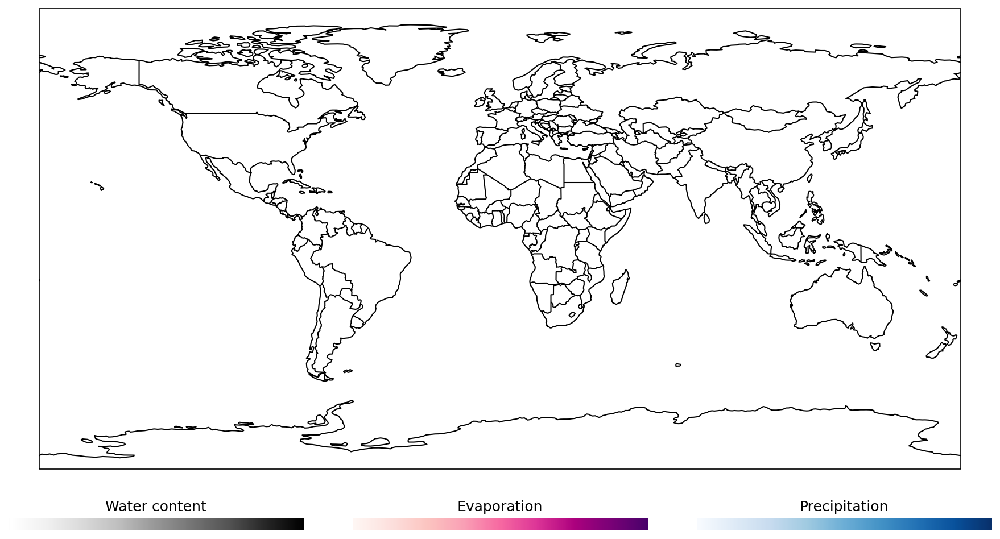

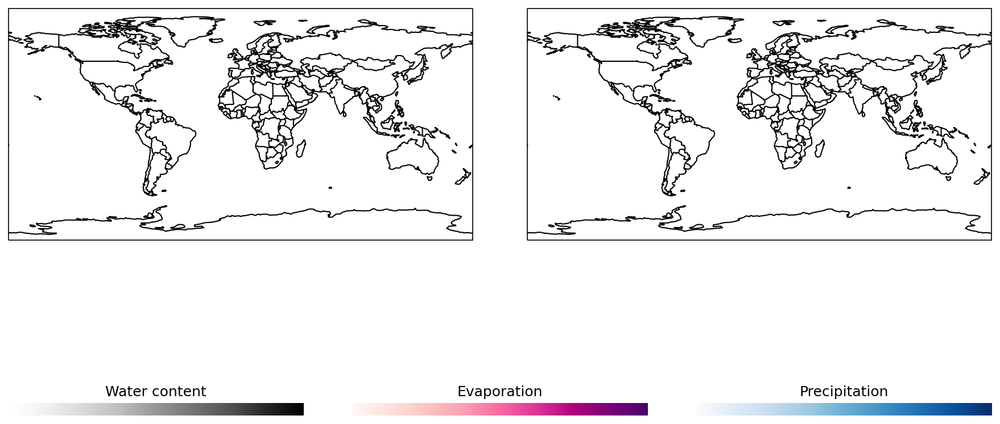

In [154]:
def make_figure():
    """Make a 1080p figure with 3 fixed colorbars at the bottom."""
    dpi = 150
    width = 1920 / dpi
    height = 1080 / dpi

    fig = plt.figure(figsize=[width, height], dpi=dpi)

    cax1 = fig.add_axes([0.05, 0.05, 0.27, 0.02])
    cax2 = fig.add_axes([0.365, 0.05, 0.27, 0.02])
    cax3 = fig.add_axes([0.68, 0.05, 0.27, 0.02])

    cax1.set_title('Water content')
    cax2.set_title('Evaporation')
    cax3.set_title('Precipitation')

    cmaps = make_cmaps()
    plot_cmaps([cax1, cax2, cax3], cmaps)

    return fig, cmaps

# Single figure
fig1, cmaps = make_figure()
ax = fig1.add_axes([0.05, 0.15, 0.9, 0.75], projection=crs.PlateCarree())
ax.coastlines()
ax.add_feature(cf.BORDERS)

# Double figure (with shared color axes)
fig2, cmaps = make_figure()
ax1 = fig2.add_axes([0.05, 0.15, 0.425, 0.75], projection=crs.PlateCarree())
ax2 = fig2.add_axes([0.525, 0.15, 0.425, 0.75], projection=crs.PlateCarree())
ax1.coastlines()
ax1.add_feature(cf.BORDERS)
ax2.coastlines()
ax2.add_feature(cf.BORDERS)


## Visualizing the input

In [190]:
input_files = '~/wam2layers/floodcase_202107/preprocessed_data/2021-07-*_fluxes_storages.nc'
input = xr.open_mfdataset(input_files).drop_duplicates('time')

evap = input.evap.load()
precip = input.precip.load()
water = (input.s_upper + input.s_lower).rename('water content').load()
water.attrs['unit'] = "kg m-2"

vmax_water = water.quantile(.999).values
vmax_evap = evap.quantile(.999).values
vmax_precip = precip.quantile(0.95).values

# Single figure
fig, cmaps = make_figure()
ax = fig.add_axes([0.05, 0.15, 0.9, 0.75], projection=crs.PlateCarree())

tempdir = Path('input_frames/')
tempdir.mkdir(exist_ok=True)

ax.coastlines()
ax.add_feature(cf.BORDERS)

ntimes = len(input.time)

print("Creating frames...")
for i, t in enumerate(input.time):
    print(f"{i}/{ntimes}, {t.values}", end='\r')

    w = water.sel(time=t).plot(ax=ax, vmin=0, vmax=vmax_water, cmap=cmaps['Water content'], add_colorbar=False)
    e = evap.sel(time=t).plot(ax=ax, vmin=0, vmax=vmax_evap, cmap=cmaps['Evaporation'], add_colorbar=False)
    p = precip.sel(time=t).plot(ax=ax, vmin=0, vmax=vmax_precip, cmap=cmaps['Precipitation'], add_colorbar=False)

    ax.set_title('wam2layers input data')
    ax.set_title(t.dt.strftime("%Y-%m-%d %H:%M").item(), loc='left')

    fig.savefig(tempdir / t.dt.strftime("input_%Y%m%dT%H%M.png").item())
    w.remove()
    e.remove()
    p.remove()

print('')
print('Done!')
fig.clf()

Creating frames...
359/360, 2021-07-15T23:00:00.000000000
Done!


In [192]:
# Note: line starting with ! is a command line call

# Combine frames into movie with ffmpeg (https://stackoverflow.com/a/37478183)
!ffmpeg -y -framerate 30 -pattern_type glob -i 'input_frames/*.png' -c:v libx264 -pix_fmt yuv420p input.mp4

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

In [193]:
# Convert to gif (copied from xmovie)
!ffmpeg -y -i input.mp4 -r 15 -s 480x320 input.gif

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

![input](input.gif "segment")

## Visualizing the output

In [232]:
# Output doesn't include time so infer it from filenames
output_files = sorted(list(Path('/home/peter/wam2layers/floodcase_202107/output_data/').glob('backtrack*')))
dates = pd.DatetimeIndex(map(lambda x: x.stem[-16:], output_files))
output = xr.open_mfdataset(output_files, combine='nested', concat_dim='time').load()
output['time'] = dates

evap = output.e_track
precip = output.tagged_precip.load()
water = (output.s_track_upper_restart + output.s_track_lower_restart).rename('water content')
water.attrs['unit'] = "kg m-2"

# Mask untracked precip
precip = precip.where(precip>0)

# Calculate cumulative sources instead of snapshots
evap.values = evap[::-1].cumsum(dim='time')[::-1]

vmax_water = water.quantile(.999).values
vmax_evap = evap.quantile(.999).values
vmax_precip = precip.quantile(0.95).values

# Single figure
fig, cmaps = make_figure()
ax = fig.add_axes([0.05, 0.15, 0.9, 0.75], projection=crs.PlateCarree())

tempdir = Path('output_frames/')
tempdir.mkdir(exist_ok=True)

ax.coastlines()
ax.add_feature(cf.BORDERS)

ntimes = len(output.time)

print("Creating frames...")
for i, t in enumerate(output.time):
    print(f"{i}/{ntimes}, {t.values}", end='\r')

    w = water.sel(time=t).plot(ax=ax, vmin=0, vmax=vmax_water, cmap=cmaps['Water content'], add_colorbar=False)
    e = evap.sel(time=t).plot(ax=ax, vmin=0, vmax=vmax_evap, cmap=cmaps['Evaporation'], add_colorbar=False)
    p = precip.sel(time=t).plot(ax=ax, vmin=0, vmax=vmax_precip, cmap=cmaps['Precipitation'], add_colorbar=False)

    ax.set_title('wam2layers input data')
    ax.set_title(t.dt.strftime("%Y-%m-%d %H:%M").item(), loc='left')

    fig.savefig(tempdir / t.dt.strftime("output_%Y%m%dT%H%M.png").item())
    w.remove()
    e.remove()
    p.remove()

print('')
print('Done!')
fig.clf()

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 5:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 5:
  #000: H5A.c line 528 in H5Ao

Creating frames...
358/359, 2021-07-15T23:00:00.000000000
Done!


<Figure size 1920x1080 with 0 Axes>

In [233]:
# Combine frames into movie with ffmpeg (https://stackoverflow.com/a/37478183)
!ffmpeg -y -framerate 30 -pattern_type glob -i 'output_frames/*.png' -c:v libx264 -pix_fmt yuv420p output.mp4

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

In [234]:
# Convert to gif (copied from xmovie)
!ffmpeg -y -i output.mp4 -r 15 -s 480x320 output.gif

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

![output](output.gif "segments")

In [238]:
# Reverse movie
!ffmpeg -y -i output.mp4 -vf reverse output_reversed.mp4

# Boomerang
!ffmpeg -y -i output.mp4 -r 15 -s 480x320 -filter_complex "[0]reverse[r];[0][r]concat=n=2:v=1:a=0" output_boomerang.gif

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

![output_boomerang](output_boomerang.gif "segment")

## Initial experiments with xmovie

In [3]:
input_files = '~/wam2layers/floodcase_202107/preprocessed_data/2021-07-*_fluxes_storages.nc'
input = xr.open_mfdataset(input_files)

Movie(input.evap).save('evap.gif', progress=True, remove_movie=False)
Movie(input.precip).save('precip.gif', progress=True, remove_movie=False)

# Use a custom plot function to plot two variables on one figure/movie frame
def plot_both(ds, fig, tt, *args, **kwargs):

    t = -tt if kwargs.get("inverse", False) else tt
    frame = ds.isel(time=t)

    ax = fig.add_subplot(111, projection=crs.PlateCarree())

    frame.evap.plot(ax=ax, vmin=0, vmax=ds.evap.max().values*1.5, cmap=cm.ice_r,
                    cbar_kwargs={'ticks': [], 'orientation': 'horizontal'})  # nice options: ice, dense, tempo, rain
    
    frame.precip.where(frame.precip>0).plot(ax=ax, vmin=0, vmax=ds.precip.max().values, cmap=cm.rain,
                                            cbar_kwargs={'ticks': [], 'orientation': 'horizontal'})

    ax.coastlines()
    ax.add_feature(cf.BORDERS)

    return ax, None

Movie(input, plot_both, input_check=False).save('both.gif', progress=True, overwrite_existing=True, remove_movie=False)

/home/peter/mambaforge/envs/wamenv/lib/python3.9/site-packages/xmovie/core.py:46: UserWarning: No `vmin` provided. Data limits are calculated from input. Depending on the input this can take long. Pass `vmin` to avoid this step
  warnings.warn(
/home/peter/mambaforge/envs/wamenv/lib/python3.9/site-packages/xmovie/core.py:53: UserWarning: No `vmax` provided. Data limits are calculated from input. Depending on the input this can take long. Pass `vmax` to avoid this step
  warnings.warn(
100%|██████████| 25/25 [00:10<00:00,  2.37it/s]


Movie created at evap.mp4


/home/peter/mambaforge/envs/wamenv/lib/python3.9/site-packages/xmovie/core.py:46: UserWarning: No `vmin` provided. Data limits are calculated from input. Depending on the input this can take long. Pass `vmin` to avoid this step
  warnings.warn(
/home/peter/mambaforge/envs/wamenv/lib/python3.9/site-packages/xmovie/core.py:53: UserWarning: No `vmax` provided. Data limits are calculated from input. Depending on the input this can take long. Pass `vmax` to avoid this step
  warnings.warn(


GIF created at evap.gif


100%|██████████| 25/25 [00:11<00:00,  2.27it/s]


Movie created at precip.mp4
GIF created at precip.gif
